# Homework 3 

## ECS271 

## Kay Royo

You will learn how to train a deep network using PyTorch tool. Please read the following tutorial. You
may skip the data parallelism section.
https://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html

CIFAR10 is a dataset of 60, 000 color images of size 32 × 32 from 10 categories. Please download the
PyTorch tutorial code for CIFAR10 to start:
https://pytorch.org/tutorials/_downloads/cifar10_tutorial.py

When you run the tutorial code, it will download CIFAR10 dataset for you. Please follow the instructions
in the following link to install PyTorch: https://pytorch.org/

To learn more, you can also find a tutorial for MNIST here:

https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html#sphx-glr-beginner-blitz-neural-networks-tutorial-py

and the sample model for MNIST here:

https://github.com/pytorch/examples/blob/master/mnist/main.py

and the sample code for Imagenet here:

https://github.com/pytorch/examples/blob/master/imagenet/main.py

For all the following sections, train the model for 50 epochs and plot the curve for loss, training accuracy,
and test accuracy evaluated every epoch.

In [24]:
# import dependencies 

import pandas as pd
import plotly
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import time
import torch.optim as optim
import plotly.io as pio
pio.renderers.default='notebook'
from IPython.display import Image

### (1) 

Run the tutorial code out of the box and make sure you get reasonable results. You will report these
results in Section 4, so no report needed here.


Notes: 

Architecture:

- Input: 32x32-pixel images with 3 channels (RGB) → 3x32x32 images
- Convolutions with 3 input channels, 6 output channels, and 5x5 square convolution → 6x28x28 images
- 2x2 max pooling (subsampling) → 6x14x14 images
- 6 input channels (from the previous Conv2d layer), 16 output channels, 5x5 square convolutions → 16x10x10 images
- 2x2 max pooling (subsampling) → 16x5x5 images
- Fully connected linear (=dense) layer with 16x5x5=400 input size and 120 output; ReLU activation
- Fully connected layer with 120 input and 84 output; ReLU activation
- Fully connected output layer with 84 input and 10 output (for the 10 classes in the CIFAR10 dataset); no/linear activation

Note that the layers are defined in the constructor and the activations applied in the forward function.

Formula to calculate the output size of a convolutional layer:

$\frac{𝑊−𝐾+2𝑃}{𝑆}+1$  with input size  𝑊  (width and height for square images), convolution size  𝐾 , padding  𝑃  (default 0), and stride  𝑆  (default 1).

Files already downloaded and verified
Files already downloaded and verified
  car  deer  frog truck


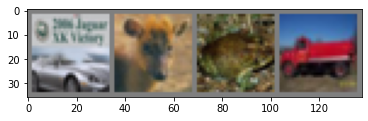

In [7]:
# Run tutorial original code
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [4]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.softmax(self.fc3(x), dim=1)
        return x
        
net = Net()
print(net)

Net(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=10, bias=True)
)


In [3]:
total = 0
print('Trainable parameters:')
for name, param in net.named_parameters():
    if param.requires_grad:
        print(name, '\t', param.numel())
        total += param.numel()
print()
print('Total', '\t', total)

Trainable parameters:
conv1.weight 	 450
conv1.bias 	 6
conv2.weight 	 2400
conv2.bias 	 16
fc1.weight 	 48000
fc1.bias 	 120
fc2.weight 	 10080
fc2.bias 	 84
fc3.weight 	 840
fc3.bias 	 10

Total 	 62006


In [5]:
import time
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [17]:
%%time

for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

[1,  2000] loss: 2.069
[1,  4000] loss: 2.048
[1,  6000] loss: 2.042
[1,  8000] loss: 2.035
[1, 10000] loss: 2.029
[1, 12000] loss: 2.026
[2,  2000] loss: 2.009
[2,  4000] loss: 2.009
[2,  6000] loss: 2.000
[2,  8000] loss: 2.004
[2, 10000] loss: 1.994
[2, 12000] loss: 1.994
Finished Training
CPU times: total: 2min 18s
Wall time: 1min 17s


GroundTruth:    cat  ship  ship plane
Predicted:   frog  ship   car  ship
Accuracy of the network on the 10000 test images: 45 %
Accuracy of plane : 45 %
Accuracy of   car : 84 %
Accuracy of  bird : 30 %
Accuracy of   cat : 23 %
Accuracy of  deer : 14 %
Accuracy of   dog : 62 %
Accuracy of  frog : 55 %
Accuracy of horse : 50 %
Accuracy of  ship : 50 %
Accuracy of truck : 33 %
cpu


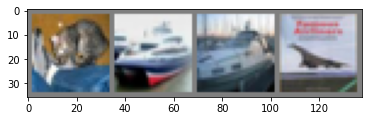

In [18]:
dataiter = iter(testloader)
images, labels = dataiter.next()

# print images
imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))


outputs = net(images)

_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % classes[predicted[j]]
                              for j in range(4)))

correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))

class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))



In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Assume that we are on a CUDA machine, then this should print a CUDA device:

print(device)


cpu


### (2) 

Change the code to have only a single fully connected layer. The model will have a single layer that
connects the input to the output. What is the number of parameters? In PyTorch, ”nn.Linear” can
be used for fully connected layer.


*Answer:*

The number of learnable parameters are 

|    Layer   | Activation shape | Activation size    | # Parameters   |
|------------|------------------|--------------------|----------------|
| Input layer| (32,32,3)        | 32 x 32 x 3 = 3072 |  0             | 
| FC1        | (3072,10)        | 3072 x 10 = 30720  |  30730         |

The number of parameters in input layer is 0 since the it has nothing to learn and only provides the shape of the input image so there are 0 learnable parameters. 

The number of parameters in fully connected layer 1 (FC1) is computed as (current layer c = 10) x (previous layer p = 3072) + (1 x c=10) where the second term (1 x c) added represents the bias term. 


Files already downloaded and verified
Files already downloaded and verified
 bird   car   dog   dog


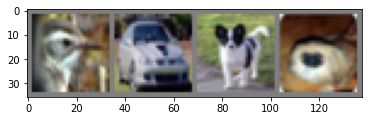

In [18]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [50]:
class FullNet1(nn.Module):
    def __init__(self):
        super(FullNet1, self).__init__()
        self.fc1 = nn.Linear(32*32*3, 10) # nn.Linear(in_features, out_features)

    def forward(self, x):
        x = x.view(-1, 32*32*3)
        x = self.fc1(x)
        #x = F.softmax(x, dim=1)
        return x


FullNet1 = FullNet1().to(device)
print(FullNet1)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(FullNet1.parameters(), lr=0.001, momentum=0.9)

FullNet1(
  (fc1): Linear(in_features=3072, out_features=10, bias=True)
)


In [32]:
# print learnable parameters 
total = 0
print('Trainable parameters:')
for name, param in FullNet1.named_parameters():
    if param.requires_grad:
        print(name, '\t', param.numel())
        total += param.numel()
print()
print('Total', '\t', total)

Trainable parameters:
fc1.weight 	 30720
fc1.bias 	 10

Total 	 30730


In [33]:
for name, p in FullNet1.named_parameters():
    print(name, ',', p.size(), type(p))

fc1.weight , torch.Size([10, 3072]) <class 'torch.nn.parameter.Parameter'>
fc1.bias , torch.Size([10]) <class 'torch.nn.parameter.Parameter'>


In [34]:
#print dimension of forward output 
x = FullNet1.forward(images)
print(x.shape)

torch.Size([4, 10])


In [20]:
#function for accuracy 
def accuracy(pred, labels):
  _, predicted = torch.max(pred, dim=1)
  correct_pred = torch.sum(predicted==labels).item()
  total_pred = len(predicted)
  accuracy = 100*(correct_pred/total_pred)
  return accuracy

In [51]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 
for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = FullNet1(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = FullNet1(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 2.1543350004715407 | train accuracy: 32.148 | test accuracy: 33.79 
*** Epoch 1 ***
loss: 2.1054822382172094 | train accuracy: 34.362 | test accuracy: 31.71 
*** Epoch 2 ***
loss: 2.086504551289878 | train accuracy: 34.882 | test accuracy: 32.63 
*** Epoch 3 ***
loss: 2.0733050030261024 | train accuracy: 35.386 | test accuracy: 34.09 
*** Epoch 4 ***
loss: 2.0614900813847887 | train accuracy: 35.818 | test accuracy: 33.76 
*** Epoch 5 ***
loss: 2.051229595792266 | train accuracy: 36.114 | test accuracy: 33.08 
*** Epoch 6 ***
loss: 2.0450370221524174 | train accuracy: 36.362 | test accuracy: 33.63 
*** Epoch 7 ***
loss: 2.042748621767097 | train accuracy: 36.446 | test accuracy: 32.23 
*** Epoch 8 ***
loss: 2.034762818364203 | train accuracy: 36.856 | test accuracy: 33.03 
*** Epoch 9 ***
loss: 2.0292925003569398 | train accuracy: 36.824 | test accuracy: 32.4 
*** Epoch 10 ***
loss: 2.0287099420471146 | train accuracy: 36.854 | test accuracy: 31.66 
*** Epoch 11 *

In [52]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,2.154335,32.148,33.79
1,1,2.105482,34.362,31.71
2,2,2.086505,34.882,32.63
3,3,2.073305,35.386,34.09
4,4,2.061490,35.818,33.76
5,5,2.051230,36.114,33.08
6,6,2.045037,36.362,33.63
7,7,2.042749,36.446,32.23
8,8,2.034763,36.856,33.03
9,9,2.029293,36.824,32.40


In [53]:
#Plot

fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')

fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')

subop = {'Train Loss': df[ 'Train Loss']}

for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )

fig.show()

In [54]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')

fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')

subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }

for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )

fig.show()

### (3) 

Change the code to have multiple fully connected layers. Try having a layer from input to 110 neurons
and then a layer to 74 neurons, and finally a layer to 10 neurons, one for each category. What happens
if you do not use ReLU? Describe why

*Answer:*

If we don't use ReLU, the accuracy of the network on the 10000 test images decreases but there only a slight difference between training time. Using ReLU in CNN tends to have better performance since it decreases the likelihood of vanishing gradient and helps with faster learning. ReLU helps eliminate the vanishing gradient issue by returning 1 for positive input value and 0 for negative input value and then it assigns a derivative of 1 for values that are greater than zero. Also, neural networks are built with perceptron so we need activation functions like ReLU to implement the classification process locally and globally. Without using activations functions like ReLU a neural network model would not have the best ability to classify sinc it would only be a large linear mapping of input and output. In other words, the model would only be a simple linear transformation, which would not work well for multi-classification. In short, the non-linearity of the activation functions like ReLU help improve the classification ability of a neural network by acting as a global or local function approximator. 

#### With ReLU

  cat   car  bird  ship


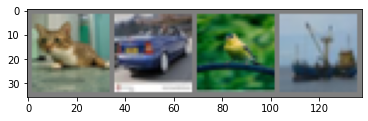

In [5]:
#use the same dataloader as part 2
# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [16]:
class FullNet2(nn.Module):
    def __init__(self):
        super(FullNet2, self).__init__()
        self.fc1 = nn.Linear(32 * 32 * 3, 110)
        self.fc2 = nn.Linear(110, 74)
        self.fc3 = nn.Linear(74, 10) # nn.Linear(in_features, out_features)

    def forward(self, x):
        x = x.view(-1, 32 * 32 * 3)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        #x = F.softmax(x, dim=1) 
        return x


FullNet2 = FullNet2()
print(FullNet2)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(FullNet2.parameters(), lr=0.001, momentum=0.9)

FullNet2(
  (fc1): Linear(in_features=3072, out_features=110, bias=True)
  (fc2): Linear(in_features=110, out_features=74, bias=True)
  (fc3): Linear(in_features=74, out_features=10, bias=True)
)


In [17]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = FullNet2(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = FullNet2(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 1.677417224572176 | train accuracy: 40.33 | test accuracy: 46.96 
*** Epoch 1 ***
loss: 1.4722141865129728 | train accuracy: 47.886 | test accuracy: 49.43 
*** Epoch 2 ***
loss: 1.3785199953989893 | train accuracy: 51.168 | test accuracy: 49.69 
*** Epoch 3 ***
loss: 1.3133843888423806 | train accuracy: 53.5 | test accuracy: 49.98 
*** Epoch 4 ***
loss: 1.262113986824923 | train accuracy: 55.01 | test accuracy: 48.81 
*** Epoch 5 ***
loss: 1.2196890833935974 | train accuracy: 56.466 | test accuracy: 50.22 
*** Epoch 6 ***
loss: 1.183028033992839 | train accuracy: 57.776 | test accuracy: 50.86 
*** Epoch 7 ***
loss: 1.1474604078730433 | train accuracy: 58.76 | test accuracy: 51.56 
*** Epoch 8 ***
loss: 1.1121967516424325 | train accuracy: 60.16 | test accuracy: 51.62 
*** Epoch 9 ***
loss: 1.0891586131139004 | train accuracy: 61.034 | test accuracy: 51.42 
*** Epoch 10 ***
loss: 1.0642123444314922 | train accuracy: 61.96 | test accuracy: 51.0 
*** Epoch 11 ***
los

In [18]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,1.677417,40.330,46.96
1,1,1.472214,47.886,49.43
2,2,1.378520,51.168,49.69
3,3,1.313384,53.500,49.98
4,4,1.262114,55.010,48.81
5,5,1.219689,56.466,50.22
6,6,1.183028,57.776,50.86
7,7,1.147460,58.760,51.56
8,8,1.112197,60.160,51.62
9,9,1.089159,61.034,51.42


In [19]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')

fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')

subop = {'Train Loss': df[ 'Train Loss']}

for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )

fig.show()

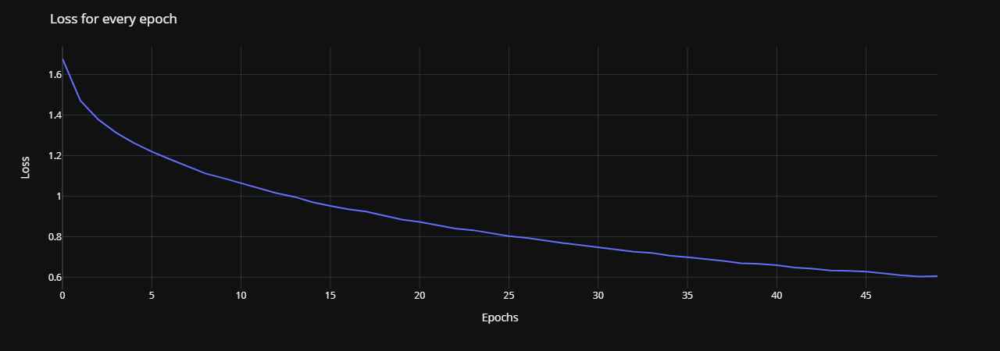

In [48]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/3a.png')

In [20]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')

fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')

subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }

for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )

fig.show()

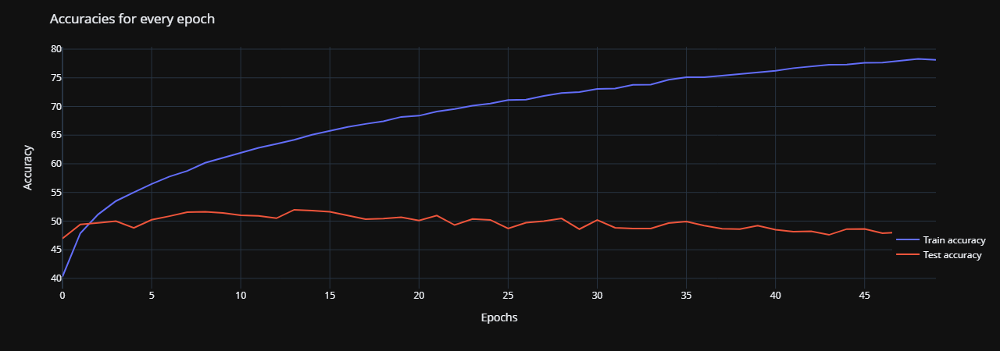

In [49]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/3b.png')

#### Without ReLU

horse truck   dog truck


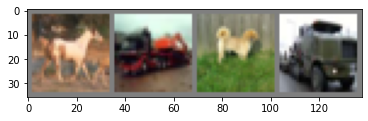

In [365]:
#same data loader as part 2 
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [22]:
class FullNet3(nn.Module):
    def __init__(self):
        super(FullNet3, self).__init__()
        self.fc1 = nn.Linear(32 * 32 * 3, 110)
        self.fc2 = nn.Linear(110, 74)
        self.fc3 = nn.Linear(74, 10) # nn.Linear(in_features, out_features)

    def forward(self, x):
        x = x.view(-1, 32 * 32 * 3)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        #x = F.softmax(self.fc3(x), dim=1)
        return x


FullNet3 = FullNet3()
print(FullNet3)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(FullNet3.parameters(), lr=0.001, momentum=0.9)

FullNet3(
  (fc1): Linear(in_features=3072, out_features=110, bias=True)
  (fc2): Linear(in_features=110, out_features=74, bias=True)
  (fc3): Linear(in_features=74, out_features=10, bias=True)
)


In [23]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = FullNet3(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = FullNet3(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 1.824201954551788 | train accuracy: 36.024 | test accuracy: 37.61 
*** Epoch 1 ***
loss: 1.7607993198348117 | train accuracy: 39.022 | test accuracy: 38.96 
*** Epoch 2 ***
loss: 1.744571483924929 | train accuracy: 39.488 | test accuracy: 38.15 
*** Epoch 3 ***
loss: 1.735694215711436 | train accuracy: 40.172 | test accuracy: 38.81 
*** Epoch 4 ***
loss: 1.727805276860408 | train accuracy: 40.246 | test accuracy: 38.78 
*** Epoch 5 ***
loss: 1.7200337460192883 | train accuracy: 40.51 | test accuracy: 38.92 
*** Epoch 6 ***
loss: 1.7175825842905734 | train accuracy: 41.084 | test accuracy: 38.93 
*** Epoch 7 ***
loss: 1.710343520393018 | train accuracy: 41.2 | test accuracy: 39.8 
*** Epoch 8 ***
loss: 1.7092819672764297 | train accuracy: 41.4 | test accuracy: 39.29 
*** Epoch 9 ***
loss: 1.7052542597022053 | train accuracy: 41.39 | test accuracy: 38.86 
*** Epoch 10 ***
loss: 1.7036450538375643 | train accuracy: 41.286 | test accuracy: 39.18 
*** Epoch 11 ***
loss

In [24]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,1.824202,36.024,37.61
1,1,1.760799,39.022,38.96
2,2,1.744571,39.488,38.15
3,3,1.735694,40.172,38.81
4,4,1.727805,40.246,38.78
5,5,1.720034,40.510,38.92
6,6,1.717583,41.084,38.93
7,7,1.710344,41.200,39.80
8,8,1.709282,41.400,39.29
9,9,1.705254,41.390,38.86


In [25]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

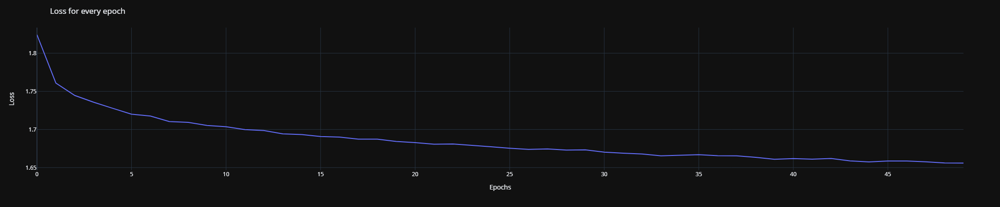

In [55]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/3aa.png')

In [26]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

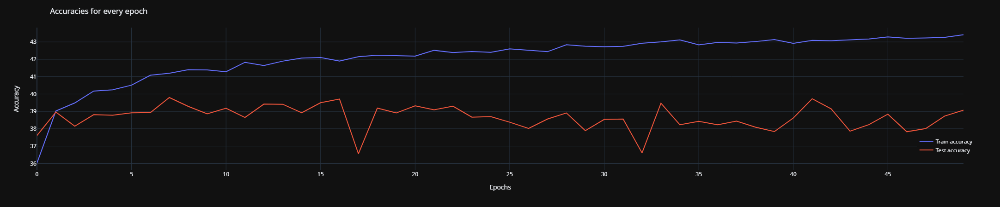

In [56]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/3bb.png')

### (4)

Change the code by adding two convolutional layers along with maxpooling layers before the fully
connected layers. This will be similar to the example in the tutorial. Use this model for the following
sections.

*Answer:*

For this part, I decided to use only two fully connected layers instead of three fully connected layers used in the tutorial. I also decided to change padding, output channels, output features, and filters. Based on the results shown below, it appears that this model yields slightly higher accuracy than the the one used in the tutorial. 

  cat   cat   dog  frog


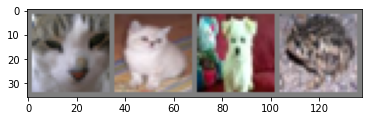

In [8]:
#use the same data loader and batch size as part 2 
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [5]:
#change padding, output channels, output features, and filters 
#change to only 2 fully connected layers to also see the effect of number of fully connected layers 
class MultiNet(nn.Module):
    def __init__(self):
        super(MultiNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 16, 3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(2, stride=2)
        self.fc1 = nn.Linear(16 * 8 * 8, 64)
        self.fc2 = nn.Linear(64, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1,16 * 8 * 8)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


MultiNet = MultiNet().to(device)
print(MultiNet)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(MultiNet.parameters(), lr=0.0002, momentum=0.9) #change learning rate 

MultiNet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=10, bias=True)
)


In [28]:
#print number of parameters 
total = 0
print('Trainable parameters:')
for name, param in MultiNet.named_parameters():
    if param.requires_grad:
        print(name, '\t', param.numel())
        total += param.numel()
print()
print('Total', '\t', total)

Trainable parameters:
conv1.weight 	 864
conv1.bias 	 32
conv2.weight 	 4608
conv2.bias 	 16
fc1.weight 	 65536
fc1.bias 	 64
fc2.weight 	 640
fc2.bias 	 10

Total 	 71770


In [30]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)
            # for i in range(4):
            #     label = labels[i]
            #     class_correct[label] += c[i].item()
            #     class_total[label] += 1
    # for i in range(10):
    #     print('Accuracy of %5s : %2d %%' % (
    #     classes[i], 100 * class_correct[i] / class_total[i]))

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 1.8780543034706547 | train accuracy: 32.146 | test accuracy: 44.02 
*** Epoch 1 ***
loss: 1.416798793092395 | train accuracy: 49.07 | test accuracy: 52.27 
*** Epoch 2 ***
loss: 1.267636388186188 | train accuracy: 54.958 | test accuracy: 56.8 
*** Epoch 3 ***
loss: 1.1584952184016184 | train accuracy: 59.014 | test accuracy: 60.48 
*** Epoch 4 ***
loss: 1.0609709163438474 | train accuracy: 62.718 | test accuracy: 62.56 
*** Epoch 5 ***
loss: 0.9825279659819844 | train accuracy: 65.39 | test accuracy: 64.96 
*** Epoch 6 ***
loss: 0.9206138926980901 | train accuracy: 67.648 | test accuracy: 65.09 
*** Epoch 7 ***
loss: 0.8718484467065832 | train accuracy: 69.508 | test accuracy: 66.23 
*** Epoch 8 ***
loss: 0.8281666102723546 | train accuracy: 71.086 | test accuracy: 67.15 
*** Epoch 9 ***
loss: 0.7911792582180597 | train accuracy: 72.312 | test accuracy: 68.87 
*** Epoch 10 ***
loss: 0.759802233920025 | train accuracy: 73.456 | test accuracy: 68.32 
*** Epoch 11 **

In [31]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,1.878054,32.146,44.02
1,1,1.416799,49.070,52.27
2,2,1.267636,54.958,56.80
3,3,1.158495,59.014,60.48
4,4,1.060971,62.718,62.56
5,5,0.982528,65.390,64.96
6,6,0.920614,67.648,65.09
7,7,0.871848,69.508,66.23
8,8,0.828167,71.086,67.15
9,9,0.791179,72.312,68.87


In [32]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

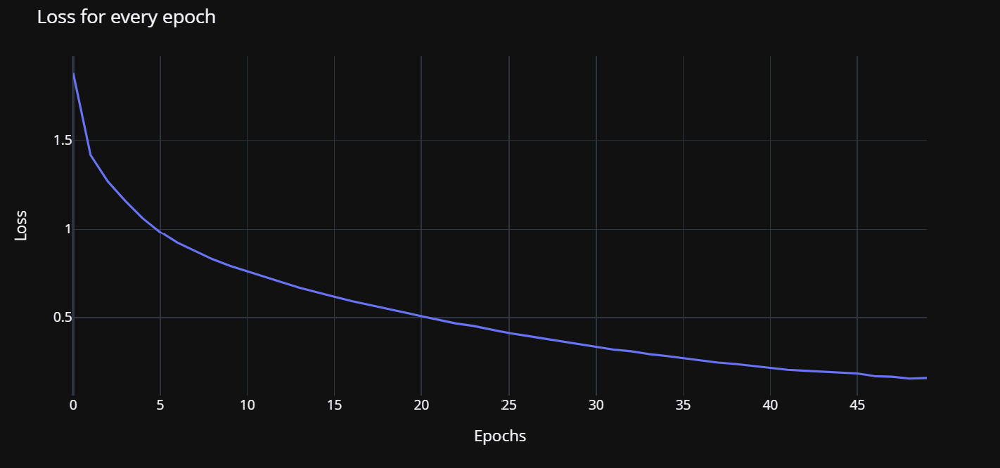

In [47]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/4a.png')

In [33]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

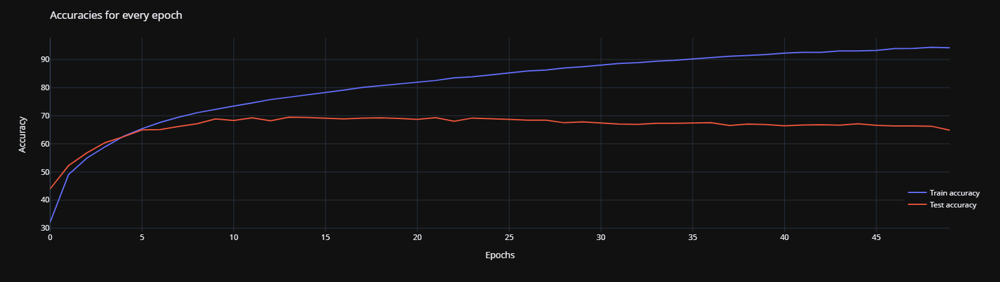

In [46]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/4b.png')

### (5)

Try multiple batch sizes to see the effect and describe the findings. Please use batch size of 1, 4, and
1000. If 1000 does not fit into the memory of your machine, please feel free to reduce it to the largest
possible number.

*Answer:*

Using the model I defined in part (4) above, batch size 1 appears to perform better than expected. For batch sizes 10, 100 and 1000, it appears that there is some overfitting since the training accuracy is so much higher compare to the test accuracy.  

#### Batch size = 4 (in part 4 above)



#### Batch size = 1 

Files already downloaded and verified
Files already downloaded and verified
  dog


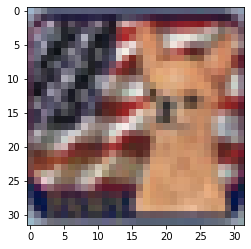

In [66]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=1,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(1)))

In [35]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(15): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 0.7999621010004819 | train accuracy: 73.08 | test accuracy: 64.38 
*** Epoch 1 ***
loss: 0.5851293112842335 | train accuracy: 79.0 | test accuracy: 63.89 
*** Epoch 2 ***
loss: 0.5306400444689515 | train accuracy: 80.922 | test accuracy: 63.9 
*** Epoch 3 ***
loss: 0.5094365636474008 | train accuracy: 81.872 | test accuracy: 64.25 
*** Epoch 4 ***
loss: 0.478789111002054 | train accuracy: 82.498 | test accuracy: 65.43 
*** Epoch 5 ***
loss: 0.4579591372638836 | train accuracy: 83.578 | test accuracy: 65.5 
*** Epoch 6 ***
loss: 0.44394022266802385 | train accuracy: 84.092 | test accuracy: 64.34 
*** Epoch 7 ***
loss: 0.42938015151365866 | train accuracy: 84.472 | test accuracy: 65.14 
*** Epoch 8 ***
loss: 0.41947313669005976 | train accuracy: 85.14 | test accuracy: 65.03 
*** Epoch 9 ***
loss: 0.4081550629241809 | train accuracy: 85.49 | test accuracy: 65.47 
*** Epoch 10 ***
loss: 0.3954313142016223 | train accuracy: 85.938 | test accuracy: 65.05 
*** Epoch 11 *

In [36]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,0.799962,73.080,64.38
1,1,0.585129,79.000,63.89
2,2,0.530640,80.922,63.90
3,3,0.509437,81.872,64.25
4,4,0.478789,82.498,65.43
5,5,0.457959,83.578,65.50
6,6,0.443940,84.092,64.34
7,7,0.429380,84.472,65.14
8,8,0.419473,85.140,65.03
9,9,0.408155,85.490,65.47


In [37]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

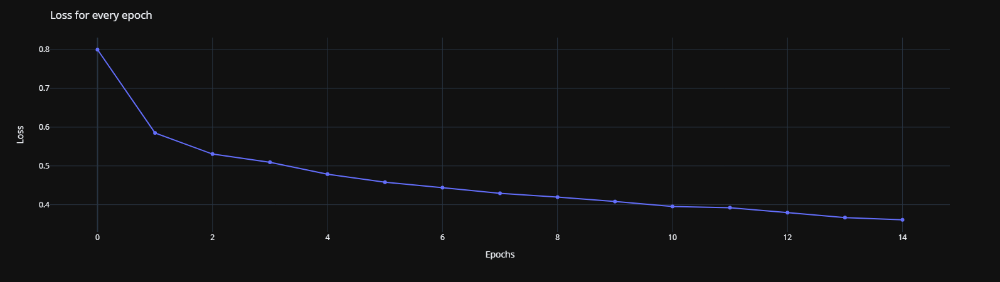

In [44]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-1a.png')

In [38]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

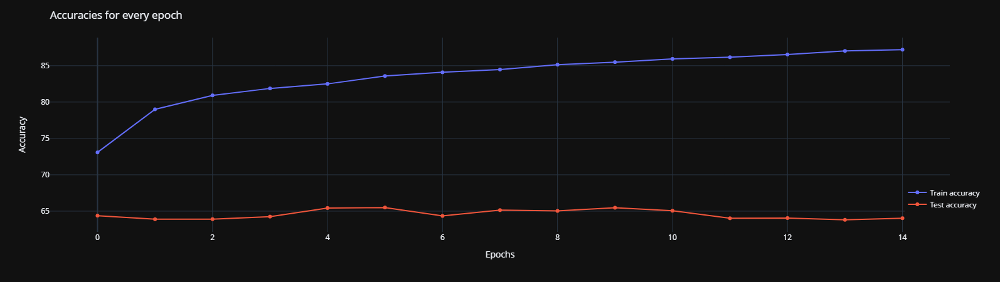

In [45]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-1b.png')

#### Batch size: 10

Files already downloaded and verified
Files already downloaded and verified
 frog   dog   cat  deer   dog  frog   cat  deer horse  bird


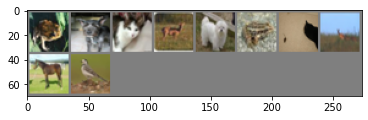

In [69]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=10,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=10,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')



# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(10)))

In [41]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 0.08677877117384591 | train accuracy: 97.412 | test accuracy: 67.5 
*** Epoch 1 ***
loss: 0.07494641703175522 | train accuracy: 97.858 | test accuracy: 67.24 
*** Epoch 2 ***
loss: 0.06609822394390862 | train accuracy: 98.23 | test accuracy: 67.0 
*** Epoch 3 ***
loss: 0.059117207788701005 | train accuracy: 98.532 | test accuracy: 67.17 
*** Epoch 4 ***
loss: 0.05337124418276868 | train accuracy: 98.718 | test accuracy: 66.91 
*** Epoch 5 ***
loss: 0.04842699483783084 | train accuracy: 98.912 | test accuracy: 66.99 
*** Epoch 6 ***
loss: 0.04425891932012715 | train accuracy: 99.044 | test accuracy: 67.03 
*** Epoch 7 ***
loss: 0.04052997631697763 | train accuracy: 99.194 | test accuracy: 67.09 
*** Epoch 8 ***
loss: 0.037180889356642946 | train accuracy: 99.296 | test accuracy: 66.91 
*** Epoch 9 ***
loss: 0.03430292609681459 | train accuracy: 99.408 | test accuracy: 67.0 
*** Epoch 10 ***
loss: 0.031635014660143804 | train accuracy: 99.476 | test accuracy: 66.85 

In [42]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,0.086779,97.412,67.50
1,1,0.074946,97.858,67.24
2,2,0.066098,98.230,67.00
3,3,0.059117,98.532,67.17
4,4,0.053371,98.718,66.91
5,5,0.048427,98.912,66.99
6,6,0.044259,99.044,67.03
7,7,0.040530,99.194,67.09
8,8,0.037181,99.296,66.91
9,9,0.034303,99.408,67.00


In [43]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

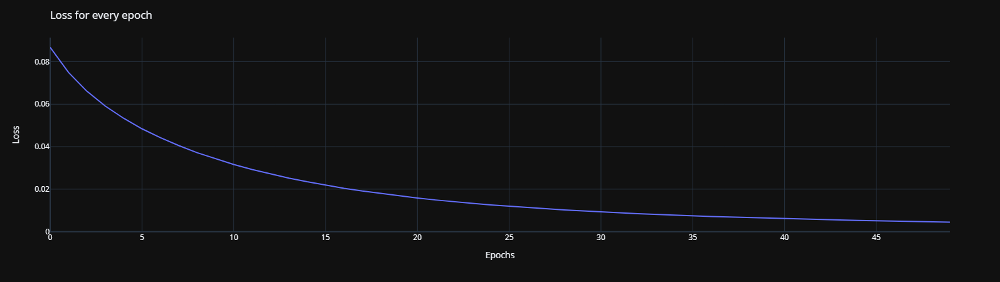

In [42]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-10a.png')

In [44]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

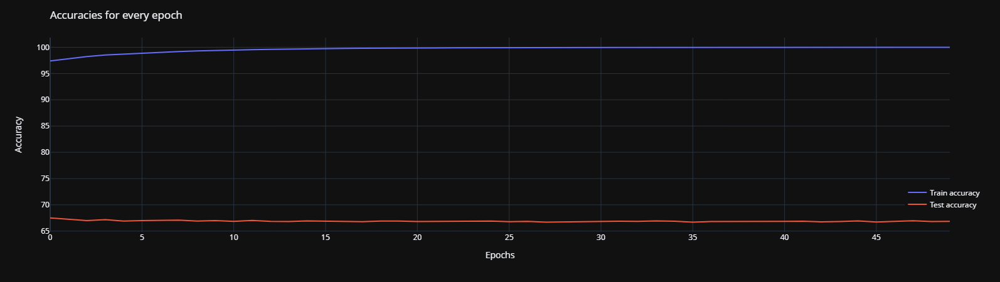

In [43]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-10b.png')

#### Batch size: 100

Files already downloaded and verified
Files already downloaded and verified
 ship truck  deer plane  frog   dog horse horse   car  bird   dog horse  ship  deer   car  bird   dog  ship truck   cat   car   car   car  ship  ship  deer  frog   dog  ship   dog   car   cat  bird  deer horse   car truck   dog plane  frog  deer plane horse   dog horse  bird truck horse   car horse  deer   car  frog  bird  frog horse truck  frog   dog horse  deer  deer  ship  deer   car   car  frog   dog  frog   car   dog  bird  bird plane   cat  ship  frog  frog truck  ship   car truck  ship   car   car  bird   dog   car   car plane   car  bird  bird   car  deer truck  frog  bird  frog   cat


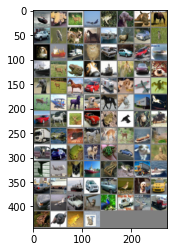

In [70]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=100,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=100,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(100)))

In [47]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 0.004217426573021528 | train accuracy: 99.994 | test accuracy: 66.84 
*** Epoch 1 ***
loss: 0.004183346701912836 | train accuracy: 99.994 | test accuracy: 66.88 
*** Epoch 2 ***
loss: 0.004166601598776041 | train accuracy: 99.994 | test accuracy: 66.87 
*** Epoch 3 ***
loss: 0.0041522467938179 | train accuracy: 99.994 | test accuracy: 66.88 
*** Epoch 4 ***
loss: 0.004139079320158638 | train accuracy: 99.994 | test accuracy: 66.89 
*** Epoch 5 ***
loss: 0.004125757714246356 | train accuracy: 99.994 | test accuracy: 66.88 
*** Epoch 6 ***
loss: 0.004113289125390605 | train accuracy: 99.994 | test accuracy: 66.88 
*** Epoch 7 ***
loss: 0.004100587565679559 | train accuracy: 99.994 | test accuracy: 66.9 
*** Epoch 8 ***
loss: 0.004088359416223585 | train accuracy: 99.994 | test accuracy: 66.9 
*** Epoch 9 ***
loss: 0.00407578945505192 | train accuracy: 99.994 | test accuracy: 66.9 
*** Epoch 10 ***
loss: 0.004064789598990598 | train accuracy: 99.994 | test accuracy: 

In [48]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,0.004217,99.994,66.84
1,1,0.004183,99.994,66.88
2,2,0.004167,99.994,66.87
3,3,0.004152,99.994,66.88
4,4,0.004139,99.994,66.89
5,5,0.004126,99.994,66.88
6,6,0.004113,99.994,66.88
7,7,0.004101,99.994,66.90
8,8,0.004088,99.994,66.90
9,9,0.004076,99.994,66.90


In [49]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

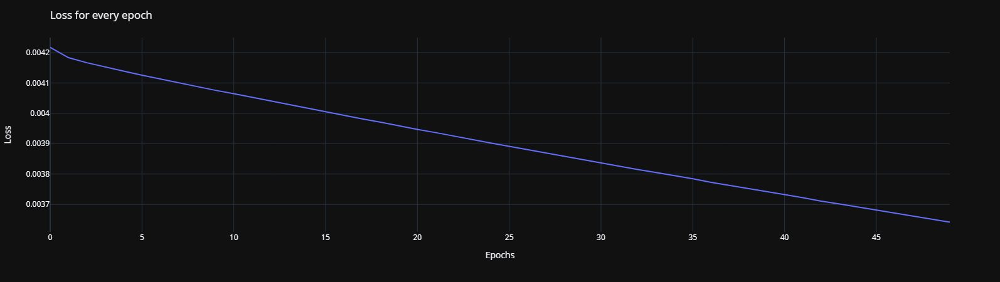

In [40]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-100a.png')

In [50]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

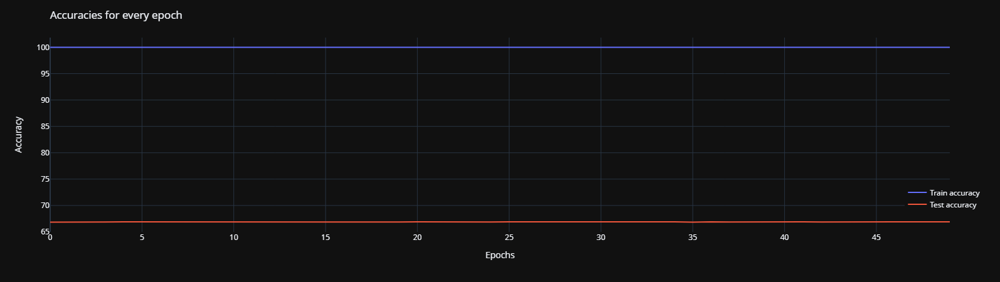

In [41]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-100b.png')

#### Batch size: 1000 

Files already downloaded and verified
Files already downloaded and verified
plane   cat truck   cat plane   car  bird  bird   cat   car   dog  frog horse   car  frog horse plane truck plane truck plane   cat   dog truck horse  bird plane  deer plane   dog horse  bird   car  frog horse  frog   dog horse  bird   car  deer truck  frog horse   dog  ship truck  ship   dog truck plane   cat horse  frog plane  deer   car horse  frog   cat   cat  frog plane  deer   dog plane  deer  ship  deer  frog horse  deer   cat truck  deer truck plane plane   dog   car horse  frog truck  bird  deer horse  deer plane   dog plane   cat   dog plane truck plane   car horse horse truck truck truck horse   dog  deer plane plane plane   car horse  ship horse  deer   dog  ship  frog  frog horse   car plane   cat   dog  frog  frog   car   car   dog  frog horse  bird  ship  bird plane  ship   dog  deer  frog horse  bird  frog horse  ship  deer   cat   dog  ship   car  frog  deer   car horse   dog horse horse   car 

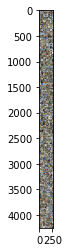

In [71]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1000,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=1000,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')



# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(1000)))

In [52]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 0.0036858302227468515 | train accuracy: 99.99400000000001 | test accuracy: 66.9 
*** Epoch 1 ***
loss: 0.0036842829253220435 | train accuracy: 99.99400000000001 | test accuracy: 66.9 
*** Epoch 2 ***
loss: 0.0036829121135251255 | train accuracy: 99.99400000000001 | test accuracy: 66.89 
*** Epoch 3 ***
loss: 0.003681747784495962 | train accuracy: 99.994 | test accuracy: 66.89 
*** Epoch 4 ***
loss: 0.0036806825367847874 | train accuracy: 99.994 | test accuracy: 66.89 
*** Epoch 5 ***
loss: 0.0036796916618335005 | train accuracy: 99.99400000000001 | test accuracy: 66.89 
*** Epoch 6 ***
loss: 0.0036785499743965206 | train accuracy: 99.994 | test accuracy: 66.89 
*** Epoch 7 ***
loss: 0.003677544602173932 | train accuracy: 99.99399999999997 | test accuracy: 66.89 
*** Epoch 8 ***
loss: 0.0036766199651649414 | train accuracy: 99.994 | test accuracy: 66.89 
*** Epoch 9 ***
loss: 0.003675467529505187 | train accuracy: 99.99400000000001 | test accuracy: 66.89 
*** Epoch

In [53]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,0.003686,99.994,66.90
1,1,0.003684,99.994,66.90
2,2,0.003683,99.994,66.89
3,3,0.003682,99.994,66.89
4,4,0.003681,99.994,66.89
5,5,0.003680,99.994,66.89
6,6,0.003679,99.994,66.89
7,7,0.003678,99.994,66.89
8,8,0.003677,99.994,66.89
9,9,0.003675,99.994,66.89


In [54]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

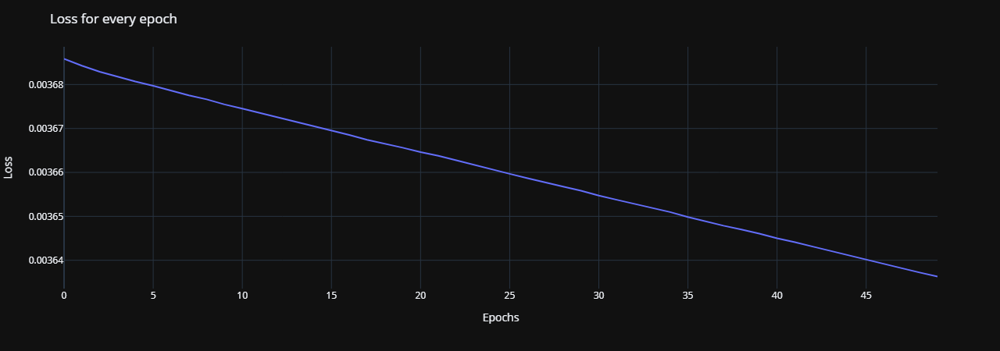

In [38]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-1000a.png')

In [55]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

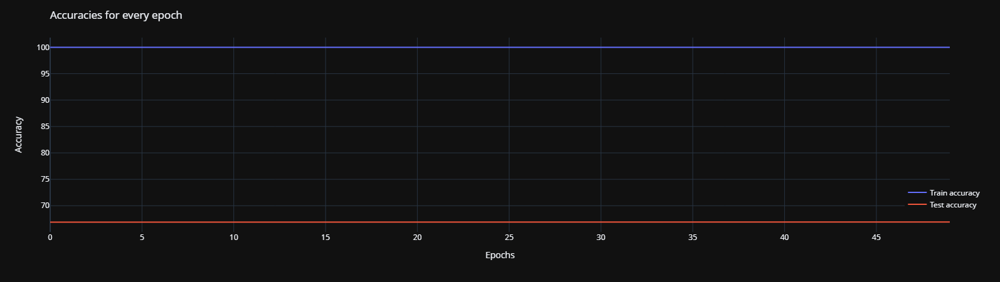

In [39]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/5-1000b.png')

### (6)

Try multiple learning rates to see the effect and describe the findings. Please use learning rates of 10,
0.1, 0.01, and 0.001.

*Answer:*

Overall, it appears that learning rates 10, 0.1, 0.01, and 0.001 are all too large for this model and data. They all yield very low test and train accuracies (~10%). The runtimes are also not significantly different. Hence, it is best to choose a much smaller learning for this model and dataset.

#### Learning rate = 10 

Observation(s): Here, a very large learning rate causes large updates that causes large loss values and possibly infinite values or NaNs. The large learning rate is causing the gradient to explode. However, the very large or infinite values could also be the result of large learning rate and deep network combined. Using learning rate 10, the network becomes unstable so the loss is larger than the ones observed so far and the accuracies are much lower.

Files already downloaded and verified
Files already downloaded and verified
plane   car horse plane


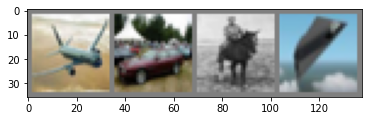

In [8]:
# using batch size = 4 
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')



# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# # show images
imshow(torchvision.utils.make_grid(images))
# # print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [9]:
# use the same model as part 4 
# change lr 
optimizer = optim.SGD(MultiNet.parameters(), lr=10, momentum=0.5)

In [11]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        #outputs = torch.nan_to_num(outputs)
        #check in outputs are Nan
        check = int((outputs != outputs).sum())
        if(check>0):
            print("data contains Nan")
        #else:
            #print("data does not contain Nan")
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        nn.utils.clip_grad_norm_(MultiNet.parameters(), 1)
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 5.1880405516646 | train accuracy: 9.926 | test accuracy: 10.0 
*** Epoch 1 ***
loss: 5.146548132747066 | train accuracy: 10.056 | test accuracy: 10.0 
*** Epoch 2 ***
loss: 5.196976502854039 | train accuracy: 9.856 | test accuracy: 10.0 
*** Epoch 3 ***
loss: 5.177698532425972 | train accuracy: 10.088 | test accuracy: 10.0 
*** Epoch 4 ***
loss: 5.1488397529062455 | train accuracy: 10.196 | test accuracy: 10.0 
*** Epoch 5 ***
loss: 5.16865594680905 | train accuracy: 10.092 | test accuracy: 10.0 
*** Epoch 6 ***
loss: 5.186575542579547 | train accuracy: 9.76 | test accuracy: 10.0 
*** Epoch 7 ***
loss: 5.1528045862855905 | train accuracy: 10.106 | test accuracy: 10.0 
*** Epoch 8 ***
loss: 5.182451105075505 | train accuracy: 9.964 | test accuracy: 10.0 
*** Epoch 9 ***
loss: 5.166777372942017 | train accuracy: 10.098 | test accuracy: 10.0 
*** Epoch 10 ***
loss: 5.162722996067301 | train accuracy: 10.174 | test accuracy: 10.0 
*** Epoch 11 ***
loss: 5.188010190651

In [12]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,5.188041,9.926,10.0
1,1,5.146548,10.056,10.0
2,2,5.196977,9.856,10.0
3,3,5.177699,10.088,10.0
4,4,5.148840,10.196,10.0
5,5,5.168656,10.092,10.0
6,6,5.186576,9.760,10.0
7,7,5.152805,10.106,10.0
8,8,5.182451,9.964,10.0
9,9,5.166777,10.098,10.0


In [16]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

In [17]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

#### Learning rate = 0.1

 ship   cat   cat  deer


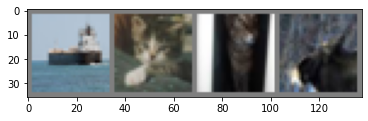

In [444]:
# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [11]:
optimizer = optim.SGD(MultiNet.parameters(), lr=0.1, momentum=0.9)

In [15]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        #print(data)
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 2.3609209210026294 | train accuracy: 9.994 | test accuracy: 10.0 
*** Epoch 1 ***
loss: 2.358136475338956 | train accuracy: 10.07 | test accuracy: 10.0 
*** Epoch 2 ***
loss: 2.3609946251621303 | train accuracy: 9.702 | test accuracy: 10.0 
*** Epoch 3 ***
loss: 2.3591029049062815 | train accuracy: 9.946 | test accuracy: 10.0 
*** Epoch 4 ***
loss: 2.3594188737682327 | train accuracy: 9.992 | test accuracy: 10.0 
*** Epoch 5 ***
loss: 2.360642668685681 | train accuracy: 9.8 | test accuracy: 10.0 
*** Epoch 6 ***
loss: 2.35801522317281 | train accuracy: 10.192 | test accuracy: 10.0 
*** Epoch 7 ***
loss: 2.3597723776573694 | train accuracy: 9.794 | test accuracy: 10.0 
*** Epoch 8 ***
loss: 2.360227543779903 | train accuracy: 10.12 | test accuracy: 10.0 
*** Epoch 9 ***
loss: 2.3596781425375357 | train accuracy: 10.038 | test accuracy: 10.0 
*** Epoch 10 ***
loss: 2.3585398669376003 | train accuracy: 9.952 | test accuracy: 10.0 
*** Epoch 11 ***
loss: 2.35861653348

In [17]:

df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,2.360921,9.994,10.0
1,1,2.358136,10.070,10.0
2,2,2.360995,9.702,10.0
3,3,2.359103,9.946,10.0
4,4,2.359419,9.992,10.0
5,5,2.360643,9.800,10.0
6,6,2.358015,10.192,10.0
7,7,2.359772,9.794,10.0
8,8,2.360228,10.120,10.0
9,9,2.359678,10.038,10.0


In [20]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

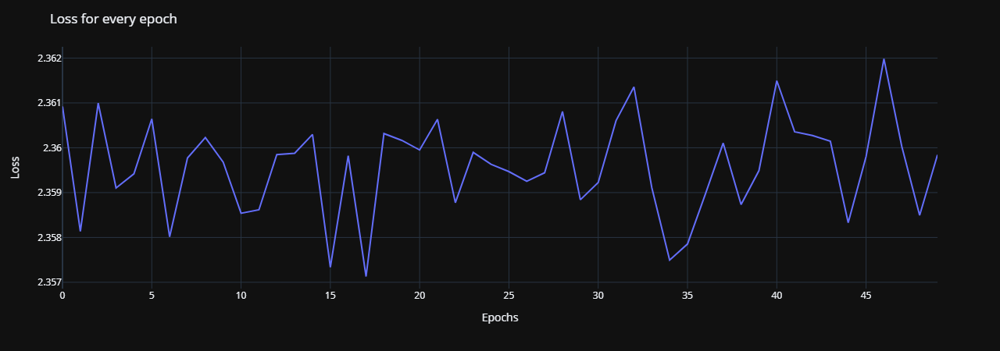

In [57]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.1a.png')

In [21]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

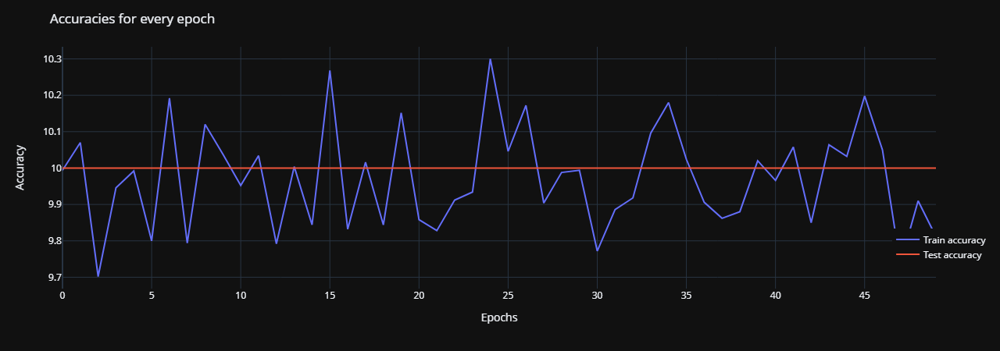

In [35]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.1b.png')

#### learning rate = 0.01

truck truck truck plane


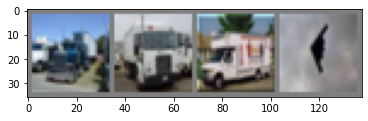

In [451]:
# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [22]:
optimizer = optim.SGD(MultiNet.parameters(), lr=0.01, momentum=0.9) #change learning rate

In [23]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        #print(data)
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 2.3090189374802694 | train accuracy: 9.898 | test accuracy: 10.0 
*** Epoch 1 ***
loss: 2.3084589612513544 | train accuracy: 10.014 | test accuracy: 10.0 
*** Epoch 2 ***
loss: 2.3084058324778898 | train accuracy: 9.876 | test accuracy: 10.0 
*** Epoch 3 ***
loss: 2.308032003896066 | train accuracy: 10.12 | test accuracy: 10.0 
*** Epoch 4 ***
loss: 2.3085325088145416 | train accuracy: 9.926 | test accuracy: 10.0 
*** Epoch 5 ***
loss: 2.3084927449293904 | train accuracy: 10.034 | test accuracy: 10.0 
*** Epoch 6 ***
loss: 2.309020870751844 | train accuracy: 9.896 | test accuracy: 10.0 
*** Epoch 7 ***
loss: 2.308691943337492 | train accuracy: 9.708 | test accuracy: 10.0 
*** Epoch 8 ***
loss: 2.3084211099795393 | train accuracy: 9.862 | test accuracy: 10.0 
*** Epoch 9 ***
loss: 2.30835693499996 | train accuracy: 9.96 | test accuracy: 10.0 
*** Epoch 10 ***
loss: 2.308614597538775 | train accuracy: 9.892 | test accuracy: 10.0 
*** Epoch 11 ***
loss: 2.30848512232

In [24]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,2.309019,9.898,10.0
1,1,2.308459,10.014,10.0
2,2,2.308406,9.876,10.0
3,3,2.308032,10.120,10.0
4,4,2.308533,9.926,10.0
5,5,2.308493,10.034,10.0
6,6,2.309021,9.896,10.0
7,7,2.308692,9.708,10.0
8,8,2.308421,9.862,10.0
9,9,2.308357,9.960,10.0


In [25]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

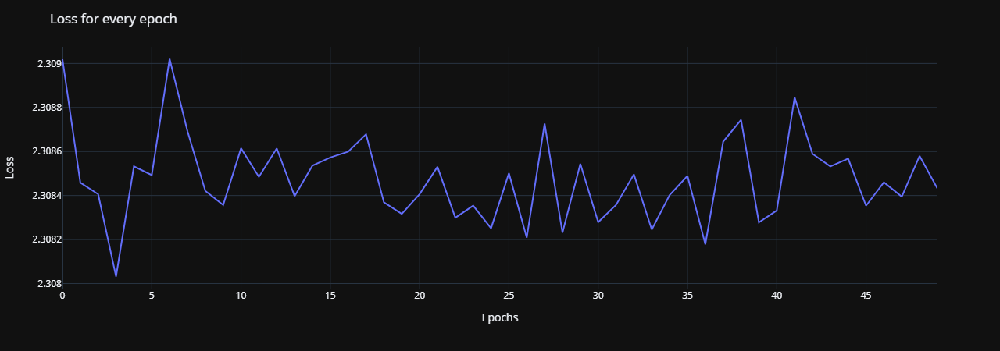

In [34]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.01a.png')

In [26]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

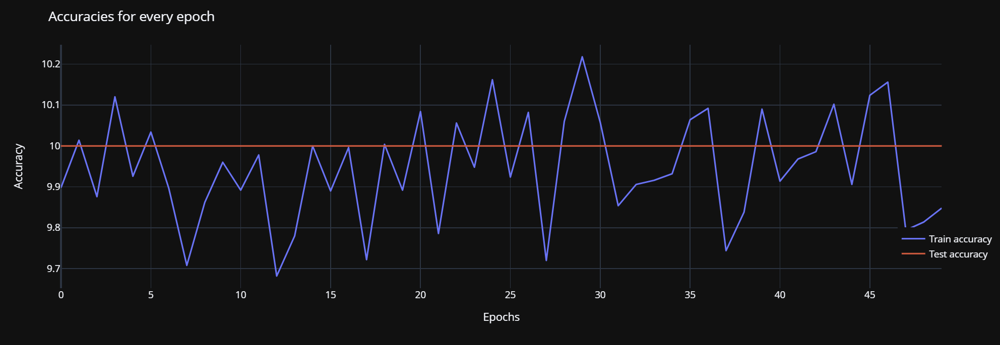

In [33]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.01b.png')

#### Learning rate = 0.001 

horse horse horse  frog


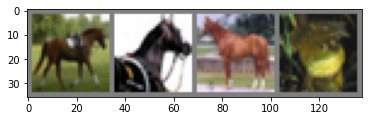

In [456]:
# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [27]:
optimizer = optim.SGD(MultiNet.parameters(), lr=0.001, momentum=0.9) #change learning rate

In [458]:
%%time
for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

[1,  2000] loss: 2.015
[1,  4000] loss: 1.633
[1,  6000] loss: 1.476
[1,  8000] loss: 1.385
[1, 10000] loss: 1.305
[1, 12000] loss: 1.247
[2,  2000] loss: 1.164
[2,  4000] loss: 1.142
[2,  6000] loss: 1.101
[2,  8000] loss: 1.076
[2, 10000] loss: 1.056
[2, 12000] loss: 1.050
Finished Training
CPU times: total: 2min 21s
Wall time: 1min 38s


GroundTruth:    cat  ship  ship plane
Predicted:   frog   car   car plane
Accuracy of the network on the 10000 test images: 63 %
Accuracy of plane : 77 %
Accuracy of   car : 79 %
Accuracy of  bird : 47 %
Accuracy of   cat : 32 %
Accuracy of  deer : 62 %
Accuracy of   dog : 52 %
Accuracy of  frog : 75 %
Accuracy of horse : 70 %
Accuracy of  ship : 69 %
Accuracy of truck : 67 %


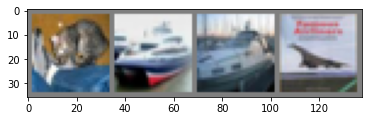

In [459]:
dataiter = iter(testloader)
images, labels = dataiter.next()

# print images
imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))


outputs = MultiNet(images)

_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % classes[predicted[j]]
                              for j in range(4)))

correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = MultiNet(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))
    
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = MultiNet(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

In [28]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        #print(data)
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 2.303632252139467 | train accuracy: 9.822 | test accuracy: 10.0 
*** Epoch 1 ***
loss: 2.303463336477013 | train accuracy: 9.976 | test accuracy: 10.0 
*** Epoch 2 ***
loss: 2.3034949693329594 | train accuracy: 9.912 | test accuracy: 10.0 
*** Epoch 3 ***
loss: 2.3034019351568267 | train accuracy: 10.152 | test accuracy: 10.0 
*** Epoch 4 ***
loss: 2.3034346294609085 | train accuracy: 9.774 | test accuracy: 10.0 
*** Epoch 5 ***
loss: 2.3034150030281233 | train accuracy: 9.834 | test accuracy: 10.0 
*** Epoch 6 ***
loss: 2.30351863388863 | train accuracy: 9.932 | test accuracy: 10.0 
*** Epoch 7 ***
loss: 2.3033991097660005 | train accuracy: 9.956 | test accuracy: 10.0 
*** Epoch 8 ***
loss: 2.3033856445240475 | train accuracy: 9.856 | test accuracy: 10.0 
*** Epoch 9 ***
loss: 2.3033937317570246 | train accuracy: 9.918 | test accuracy: 10.0 
*** Epoch 10 ***
loss: 2.3034664522467523 | train accuracy: 10.038 | test accuracy: 10.0 
*** Epoch 11 ***
loss: 2.30340940

In [29]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,2.303632,9.822,10.0
1,1,2.303463,9.976,10.0
2,2,2.303495,9.912,10.0
3,3,2.303402,10.152,10.0
4,4,2.303435,9.774,10.0
5,5,2.303415,9.834,10.0
6,6,2.303519,9.932,10.0
7,7,2.303399,9.956,10.0
8,8,2.303386,9.856,10.0
9,9,2.303394,9.918,10.0


In [30]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

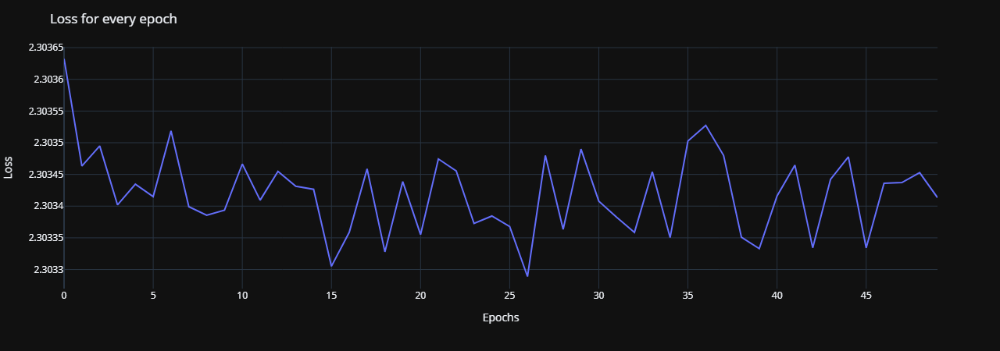

In [32]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.001a.png')

In [31]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

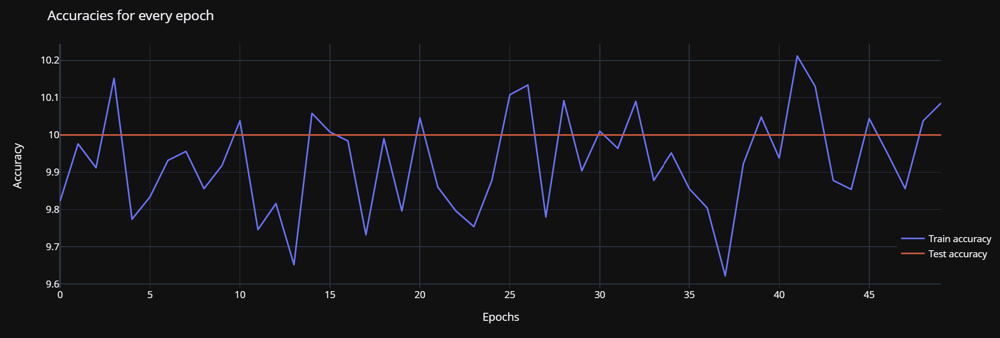

In [31]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/6-0.001b.png')

### (7) 

Please add some data augmentation to avoid overfitting. Note that you need to do this only for the
trainnig and not the testing. You may use line 208 from Imagenet sample code:
https://github.com/pytorch/examples/blob/master/imagenet/main.py
”RandomResizedCrop” samples a random patch from the image to train the model on. ”RandomHorizontalFlip” flips randomly chosen images horizontally.

*Answer:*

Using data augmentation, the model seems to perfrom well. The accuracy plot shows that the training and test accuracies are somewhat closer compare to the accuracy plots shown in the previous sections. The plot also also shows that the loss smoothly decreases to a small value after multiple epochs. 

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 bird  deer  bird  frog


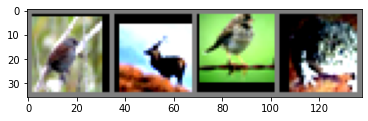

In [32]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=train_transform)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=test_transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [34]:
optimizer = optim.SGD(MultiNet.parameters(), lr=0.0002, momentum=0.9) #use the same learning rate as part 4 

In [35]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        #print(data)
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 1.8086859489290301 | train accuracy: 33.416 | test accuracy: 39.96 
*** Epoch 1 ***
loss: 1.6852646669260702 | train accuracy: 37.898 | test accuracy: 41.18 
*** Epoch 2 ***
loss: 1.6212948598960122 | train accuracy: 40.464 | test accuracy: 44.69 
*** Epoch 3 ***
loss: 1.543987396402601 | train accuracy: 43.186 | test accuracy: 48.8 
*** Epoch 4 ***
loss: 1.4645929705625496 | train accuracy: 46.532 | test accuracy: 51.17 
*** Epoch 5 ***
loss: 1.4004847430803269 | train accuracy: 49.39 | test accuracy: 52.56 
*** Epoch 6 ***
loss: 1.3558163988927867 | train accuracy: 51.168 | test accuracy: 55.21 
*** Epoch 7 ***
loss: 1.3229486953521674 | train accuracy: 52.366 | test accuracy: 56.5 
*** Epoch 8 ***
loss: 1.2946175028758438 | train accuracy: 53.42 | test accuracy: 57.2 
*** Epoch 9 ***
loss: 1.266718249699766 | train accuracy: 54.482 | test accuracy: 58.9 
*** Epoch 10 ***
loss: 1.2446251323667037 | train accuracy: 55.392 | test accuracy: 58.92 
*** Epoch 11 ***


In [36]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,1.808686,33.416,39.96
1,1,1.685265,37.898,41.18
2,2,1.621295,40.464,44.69
3,3,1.543987,43.186,48.80
4,4,1.464593,46.532,51.17
5,5,1.400485,49.390,52.56
6,6,1.355816,51.168,55.21
7,7,1.322949,52.366,56.50
8,8,1.294618,53.420,57.20
9,9,1.266718,54.482,58.90


In [37]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

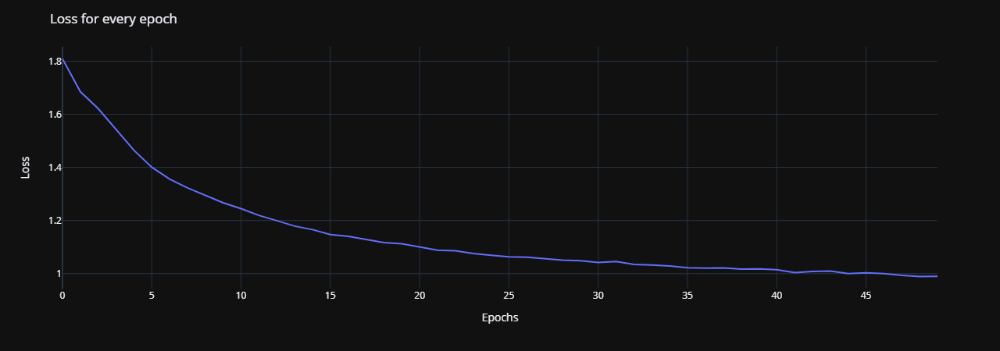

In [29]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/7a.png')

In [38]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

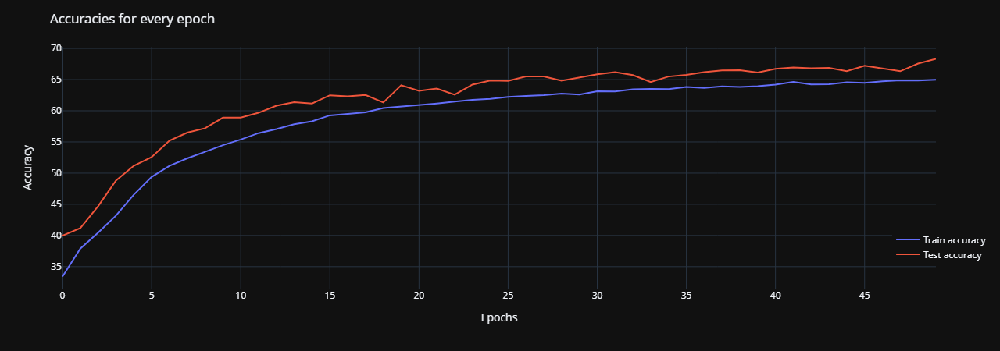

In [30]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/7b.png')

### (8)

Change the loss function from Cross Entropy to Mean Squared Error and report the effect.

*Answer:*

Switching from cross-entropy to mean-squared error very slightly reduces the overall accuracy since MSE does not perform well in classification generally. Multi-Classfication problems are not typically convex, continuous or differentiable so MSE is not very useful in this case. MSE is more useful in regression problems where the target to be predicted is numerical. When used in classification problems, MSE tends to emphasize incorrect outputs.The losses obtained also appears to be much smaller than ones obtained using cross entropy but we can't compare them using these numberical values since they are different. The time it takes to train and test using mse is not very different from cross entropy. 

Files already downloaded and verified
Files already downloaded and verified
 frog   cat   car  frog


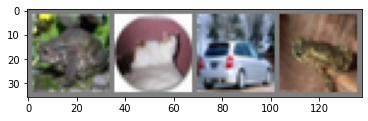

In [46]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [43]:
criterion = nn.MSELoss()
optimizer = optim.SGD(MultiNet.parameters(), lr=0.0002, momentum=0.9)

In [42]:
#one-hot encoder 
def Labelarrays(labels):
    m = np.zeros((labels.shape[0], 10))
    for i in range(len(labels)):
        m[i][labels[i]] = 1

    return torch.FloatTensor(m)

In [59]:
#revised accuracy func
def accuracy(pred, labels):
    _, predicted = torch.max(pred, dim=1)
    _, labels = torch.max(labels, dim=1)
    correct_pred = torch.sum(predicted==labels).item()
    total_pred = len(predicted)
    accuracy = 100*(correct_pred/total_pred)
    return accuracy

In [62]:
%%time
#train and test model 
train_loss = [] #training loss 
train_acc = [] #training accuracy
test_acc = [] #testing accuracy 

for epoch in range(50): 
    print("*** Epoch {} ***".format(epoch)) #print current epoch 
    
    #train
    total_loss  = 0.0
    train_accs = []
    for i, data in enumerate(trainloader, 0):
        #print(data)
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        labels = Labelarrays(labels)
        optimizer.zero_grad()
        outputs = MultiNet(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item()
        tr_acc = accuracy(outputs,labels)
        loss.backward()
        optimizer.step()
        train_accs.append(tr_acc)
    #save train results 
    train_loss_per_epoch = total_loss/i
    train_loss.append(train_loss_per_epoch) 
    train_acc_per_epoch = sum(train_accs)/len(train_accs)
    train_acc.append(train_acc_per_epoch)
    
    #test 
    test_accs = []
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            labels = Labelarrays(labels)
            outputs = MultiNet(images)
            te_acc = accuracy(outputs,labels)
            test_accs.append(te_acc)

    #save test results 
    test_acc_per_epoch = sum(test_accs)/len(test_accs)
    test_acc.append(test_acc_per_epoch)

    print('loss: {} | train accuracy: {} | test accuracy: {} '.format(train_loss_per_epoch, train_acc_per_epoch, test_acc_per_epoch))

*** Epoch 0 ***
loss: 0.06802025815040286 | train accuracy: 52.654 | test accuracy: 52.4 
*** Epoch 1 ***
loss: 0.066779491464568 | train accuracy: 53.828 | test accuracy: 53.86 
*** Epoch 2 ***
loss: 0.06563827798965073 | train accuracy: 54.892 | test accuracy: 53.93 
*** Epoch 3 ***
loss: 0.06462351817237405 | train accuracy: 55.912 | test accuracy: 55.23 
*** Epoch 4 ***
loss: 0.06367916419620923 | train accuracy: 56.586 | test accuracy: 55.63 
*** Epoch 5 ***
loss: 0.06285115087698274 | train accuracy: 57.05 | test accuracy: 56.47 
*** Epoch 6 ***
loss: 0.06212191315299565 | train accuracy: 57.672 | test accuracy: 56.04 
*** Epoch 7 ***
loss: 0.061439274911665086 | train accuracy: 58.142 | test accuracy: 58.1 
*** Epoch 8 ***
loss: 0.06080624803473617 | train accuracy: 58.656 | test accuracy: 58.05 
*** Epoch 9 ***
loss: 0.06025298834328392 | train accuracy: 59.094 | test accuracy: 58.25 
*** Epoch 10 ***
loss: 0.059720169354719854 | train accuracy: 59.516 | test accuracy: 58.74 
*

In [63]:
df1 = pd.DataFrame.from_dict(train_loss)
df2 = pd.DataFrame.from_dict(train_acc) #, columns=['Train accuracy'])
df3 = pd.DataFrame.from_dict(test_acc) #, columns=['Test accuracy'])
dfs = [df1, df2, df3]
df = pd.concat(dfs, axis=1)
df.columns = ['Train Loss', 'Train accuracy', 'Test accuracy']
df = df.rename_axis('epochs').reset_index()
df

,epochs,Train Loss,Train accuracy,Test accuracy
0,0,0.068020,52.654,52.40
1,1,0.066779,53.828,53.86
2,2,0.065638,54.892,53.93
3,3,0.064624,55.912,55.23
4,4,0.063679,56.586,55.63
5,5,0.062851,57.050,56.47
6,6,0.062122,57.672,56.04
7,7,0.061439,58.142,58.10
8,8,0.060806,58.656,58.05
9,9,0.060253,59.094,58.25


In [64]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.85), title = 'Loss for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Loss')
subop = {'Train Loss': df[ 'Train Loss']}
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

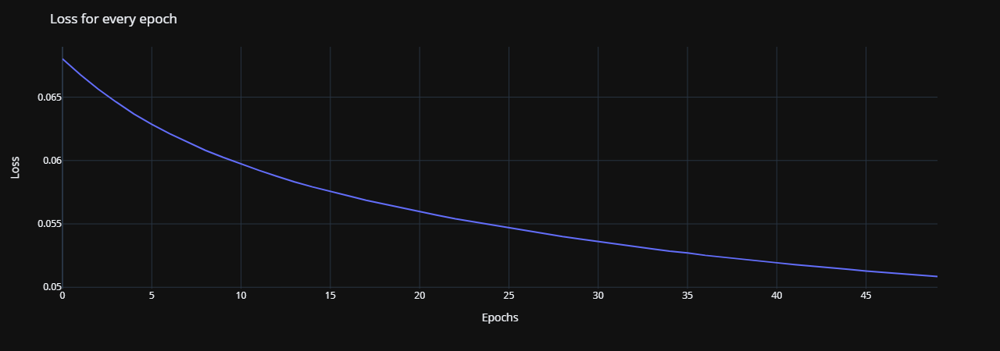

In [28]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/8a.png')

In [65]:
fig = px.line()
fig.update_layout(template = 'plotly_dark',legend=dict(title = '', 
    yanchor="top",
    y=0.25,
    xanchor="left",
    x=0.95), title = 'Accuracies for every epoch')
fig.update_xaxes(title_text='Epochs')
fig.update_yaxes(title_text='Accuracy')
subop = {#'Train Loss': df[ 'Train Loss'],
         'Train accuracy': df[ 'Train accuracy'],
         'Test accuracy': df[ 'Test accuracy'] }
for k, v in subop.items():
    fig.add_scatter(x=v.index, y = v, name = k )
fig.show()

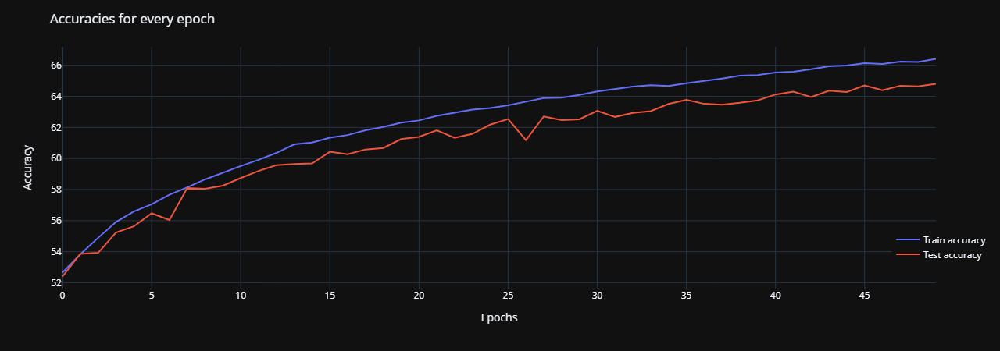

In [25]:
# Since I forgot to add `pio.renderers.default='notebook'` before plotting majority of my results, 
# I have to save most of the plotly plots I generated and redisplay their non-interactive image version 
# to avoid rerunning all the training and testing codes and save time 

Image(filename='plots/8b.png')